In [1]:
# hide pakcage non critical warnings

import warnings

warnings.filterwarnings('ignore')

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))


%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
import matplotlib.pyplot as plt

import scipy.io as sio

import torch
import torch.nn as nn

import torch.nn.functional as F
import torch.nn.init as init

from custom_data import DCCPT_data

from config import cfg, get_data_dir, get_output_dir, AverageMeter, remove_files_in_dir

from tensorboard_logger import Logger

import os
import random
import numpy as np

import data_params as dp

In [4]:
import devkit.api as dk

1. Initialization.
- The embedding parameters are initialized using the stacked denoising autoencoder (SDAE) framework. Encoder-decoder layer pairs are pretrained sequentially, from the outer to the inner.
- After all layer pairs are pretrained, the entire SDAE is fine-tuned end-to-end using the reconstruction loss.
- These parameters are used to initialize the representatives Z, which are set to Z = Y = F(X).



# data loader

In [5]:
use_cuda = torch.cuda.is_available()

In [6]:
use_cuda

False

In [15]:
datadir = get_data_dir("mnist")
outputdir = get_output_dir("mnist")

In [1]:
import scipy.io as sio

In [5]:
train_data = sio.loadmat('home/egxxlch/dev/DCC/data/mnist/traindata.mat')

TypeError: 'NoneType' object is not iterable

In [16]:
print(datadir, outputdir)

/home/egxxlch/dev/DCC/data/mnist /home/egxxlch/dev/DCC/data/mnist/results


In [17]:
loggin_dir = os.path.join(outputdir, 'runs', 'pretraining')
os.makedirs(loggin_dir, exist_ok=True)

loggin_dir = os.path.join(loggin_dir, '%s' % (1))

remove_files_in_dir(loggin_dir)

logger = Logger(loggin_dir)

In [18]:
cfg.RNG_SEED

50

In [19]:
manualSeed = 50
random.seed(manualSeed)
np.random.seed(manualSeed)
torch.manual_seed(manualSeed)

In [20]:
trainset = DCCPT_data(root=datadir, train=True, h5=False)

testset = DCCPT_data(root=datadir, train=False, h5=False)

In [21]:
niter = 50000  # how many batches you used to train model
batchsize = 256
step = 20000

nepoch = int(np.ceil(np.array(niter * batchsize, dtype=float) / len(trainset)))

step = int(np.ceil(np.array(step * batchsize, dtype=float) / len(trainset)))

In [22]:
trainset.train_data.shape

(60000, 784)

In [23]:
trainset.train_labels.shape

(60000,)

In [24]:
trainset.train_data.shape

(60000, 784)

In [25]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batchsize, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=True)

# viz for raw data

## umap

In [80]:
dk.data_viz(X=trainset.train_data, y=trainset.train_labels, random_state=2)

NameError: name 'dk' is not defined

## tsne

Text(0.5, 1.0, 'UMAP projection of the embedding dataset')

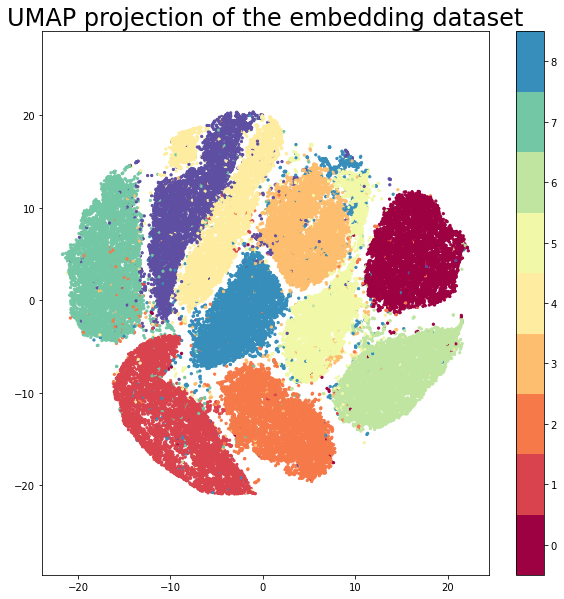

In [34]:
dk.data_viz(X=trainset.train_data, y=trainset.train_labels, method='tsne', n_iter=500, random_state=2)

# pretrain

In [29]:
class SDAE(nn.Module):
    def __init__(self, dim, dropout=0.2, slope=0.0):
        super(SDAE, self).__init__()
        self.in_dim = dim[0]
        self.nlayers = len(dim)-1
        self.reluslope = slope
        self.enc, self.dec = [], []
        for i in range(self.nlayers):
            self.enc.append(nn.Linear(dim[i], dim[i+1]))
            setattr(self, 'enc_{}'.format(i), self.enc[-1])
            self.dec.append(nn.Linear(dim[i+1], dim[i]))
            setattr(self, 'dec_{}'.format(i), self.dec[-1])
        self.base = []
        for i in range(self.nlayers):
            self.base.append(nn.Sequential(*self.enc[:i]))
        self.dropmodule1 = nn.Dropout(p=dropout)
        self.dropmodule2 = nn.Dropout(p=dropout)
        self.loss = nn.MSELoss(reduction='mean')

        # initialization
        for m in self.modules():
            if isinstance(m, nn.Linear):
                init.normal_(m.weight, std=1e-2)
                if m.bias.data is not None:
                    init.constant_(m.bias, 0)

    def forward(self,x,index):
        inp = x.view(-1, self.in_dim)
        encoded = inp
        for i, encoder in enumerate(self.enc):
            if i < index:
                encoded = encoder(encoded)
                if i < self.nlayers-1:
                    encoded = F.leaky_relu(encoded, negative_slope=self.reluslope)
            if i == index:
                inp = encoded
                out = encoded
                if index:
                    out = self.dropmodule1(out)
                out = encoder(out)
        if index < self.nlayers-1:
            out = F.leaky_relu(out, negative_slope=self.reluslope)
            out = self.dropmodule2(out)
        if index >= self.nlayers:
            out = encoded
        for i, decoder in reversed(list(enumerate(self.dec))):
            if index >= self.nlayers:
                out = decoder(out)
                if i:
                    out = F.leaky_relu(out, negative_slope=self.reluslope)
            if i == index:
                out = decoder(out)
                if index:
                    out = F.leaky_relu(out, negative_slope=self.reluslope)
        out = self.loss(out, inp)
        return out

In [30]:
net_sdae = SDAE(dim=[784, 500, 500, 2000, 10], dropout=0.2, slope=0)

In [31]:
nlayers = 4
maxepoch = [nepoch]*nlayers + [nepoch*2]
stepsize = [step]*(nlayers+1)


In [32]:
maxepoch

[214, 214, 214, 214, 428]

In [27]:
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.autograd import Variable
import torch.backends.cudnn as cudnn


# Training
def train(trainloader, net, index, optimizer, epoch, use_cuda, logger):
    losses = AverageMeter()

    print('\nIndex: %d \t Epoch: %d' %(index,epoch))

    net.train()

    for batch_idx, (inputs, targets) in enumerate(trainloader):
        if use_cuda:
            inputs = inputs.cuda()
        optimizer.zero_grad()
        inputs_Var = Variable(inputs)
        outputs = net(inputs_Var, index)

        # record loss
        losses.update(outputs.item(), inputs.size(0))

        outputs.backward()
        optimizer.step()

    # log to TensorBoard
    if logger:
        logger.log_value('train_loss_{}'.format(index), losses.avg, epoch)


# Testing
def test(testloader, net, index, epoch, use_cuda, logger):
    losses = AverageMeter()

    net.eval()

    for batch_idx, (inputs, targets) in enumerate(testloader):
        if use_cuda:
            inputs = inputs.cuda()
        with torch.no_grad():
            inputs_Var = Variable(inputs)
            outputs = net(inputs_Var, index)

            # measure accuracy and record loss
            losses.update(outputs.item(), inputs.size(0))

    # log to TensorBoard
    if logger:
        logger.log_value('val_loss_{}'.format(index), losses.avg, epoch)


# Saving checkpoint
def save_checkpoint(state, index, filename):
    torch.save(state, filename+'/checkpoint_%d.pth.tar' % index)


In [28]:
# 逐层预训练
startlayer = 0
lr = 0.01

for index in range(startlayer, nlayers+1):
    if index < nlayers:  # freezing previous layer weights
        for params_ in net_sdae.base[index].parameters():
            params_.requires_grad = False
        
    else:
        for params_ in net_sdae.base[nlayers-1].parameters():
            params_.requires_grad = True
    
    # setting up optimizer - the bias params should have twice the learning rate w.r.t. weights params
    bias_params = filter(lambda x: ('bias' in x[0]) and (x[1].requires_grad), net_sdae.named_parameters())
    bias_params = list(map(lambda x: x[1], bias_params))
    nonbias_params = filter(lambda x: ('bias' not in x[0]) and (x[1].requires_grad), net_sdae.named_parameters())
    nonbias_params = list(map(lambda x: x[1], nonbias_params))

    optimizer = optim.SGD([{'params': bias_params, 'lr': 2*lr}, {'params': nonbias_params}],
                          lr=lr, momentum=0.9, weight_decay=0.0, nesterov=True)
    
    optimizer.step()
    
    scheduler = lr_scheduler.StepLR(optimizer, step_size=stepsize[index], gamma=0.1)

    print('\nIndex: %d \t Maxepoch: %d'%(index, maxepoch[index]))      

    for epoch in range(maxepoch[index]):
        scheduler.step()
        train(trainloader, net_sdae, index, optimizer, epoch, use_cuda, logger)
        test(testloader, net_sdae, index, epoch, use_cuda, logger)
        # Save checkpoint
        save_checkpoint({'epoch': epoch+1, 'state_dict': net_sdae.state_dict(), 'optimizer': optimizer.state_dict()},
                        index, filename=outputdir)


Index: 0 	 Maxepoch: 214

Index: 0 	 Epoch: 0


/Users/jasper/opt/miniconda3/envs/mmc/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:82: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule.See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)



Index: 0 	 Epoch: 1

Index: 0 	 Epoch: 2

Index: 0 	 Epoch: 3

Index: 0 	 Epoch: 4

Index: 0 	 Epoch: 5

Index: 0 	 Epoch: 6

Index: 0 	 Epoch: 7

Index: 0 	 Epoch: 8

Index: 0 	 Epoch: 9

Index: 0 	 Epoch: 10

Index: 0 	 Epoch: 11

Index: 0 	 Epoch: 12

Index: 0 	 Epoch: 13

Index: 0 	 Epoch: 14

Index: 0 	 Epoch: 15

Index: 0 	 Epoch: 16

Index: 0 	 Epoch: 17

Index: 0 	 Epoch: 18

Index: 0 	 Epoch: 19

Index: 0 	 Epoch: 20

Index: 0 	 Epoch: 21

Index: 0 	 Epoch: 22

Index: 0 	 Epoch: 23

Index: 0 	 Epoch: 24

Index: 0 	 Epoch: 25

Index: 0 	 Epoch: 26

Index: 0 	 Epoch: 27

Index: 0 	 Epoch: 28

Index: 0 	 Epoch: 29

Index: 0 	 Epoch: 30

Index: 0 	 Epoch: 31

Index: 0 	 Epoch: 32

Index: 0 	 Epoch: 33

Index: 0 	 Epoch: 34

Index: 0 	 Epoch: 35

Index: 0 	 Epoch: 36

Index: 0 	 Epoch: 37

Index: 0 	 Epoch: 38

Index: 0 	 Epoch: 39

Index: 0 	 Epoch: 40

Index: 0 	 Epoch: 41

Index: 0 	 Epoch: 42

Index: 0 	 Epoch: 43

Index: 0 	 Epoch: 44

Index: 0 	 Epoch: 45

Index: 0 	 Epoch: 


Index: 1 	 Epoch: 152

Index: 1 	 Epoch: 153

Index: 1 	 Epoch: 154

Index: 1 	 Epoch: 155

Index: 1 	 Epoch: 156

Index: 1 	 Epoch: 157

Index: 1 	 Epoch: 158

Index: 1 	 Epoch: 159

Index: 1 	 Epoch: 160

Index: 1 	 Epoch: 161

Index: 1 	 Epoch: 162

Index: 1 	 Epoch: 163

Index: 1 	 Epoch: 164

Index: 1 	 Epoch: 165

Index: 1 	 Epoch: 166

Index: 1 	 Epoch: 167

Index: 1 	 Epoch: 168

Index: 1 	 Epoch: 169

Index: 1 	 Epoch: 170

Index: 1 	 Epoch: 171

Index: 1 	 Epoch: 172

Index: 1 	 Epoch: 173

Index: 1 	 Epoch: 174

Index: 1 	 Epoch: 175

Index: 1 	 Epoch: 176

Index: 1 	 Epoch: 177

Index: 1 	 Epoch: 178

Index: 1 	 Epoch: 179

Index: 1 	 Epoch: 180

Index: 1 	 Epoch: 181

Index: 1 	 Epoch: 182

Index: 1 	 Epoch: 183

Index: 1 	 Epoch: 184

Index: 1 	 Epoch: 185

Index: 1 	 Epoch: 186

Index: 1 	 Epoch: 187

Index: 1 	 Epoch: 188

Index: 1 	 Epoch: 189

Index: 1 	 Epoch: 190

Index: 1 	 Epoch: 191

Index: 1 	 Epoch: 192

Index: 1 	 Epoch: 193

Index: 1 	 Epoch: 194

Index: 1 	


Index: 3 	 Epoch: 87

Index: 3 	 Epoch: 88

Index: 3 	 Epoch: 89

Index: 3 	 Epoch: 90

Index: 3 	 Epoch: 91

Index: 3 	 Epoch: 92

Index: 3 	 Epoch: 93

Index: 3 	 Epoch: 94

Index: 3 	 Epoch: 95

Index: 3 	 Epoch: 96

Index: 3 	 Epoch: 97

Index: 3 	 Epoch: 98

Index: 3 	 Epoch: 99

Index: 3 	 Epoch: 100

Index: 3 	 Epoch: 101

Index: 3 	 Epoch: 102

Index: 3 	 Epoch: 103

Index: 3 	 Epoch: 104

Index: 3 	 Epoch: 105

Index: 3 	 Epoch: 106

Index: 3 	 Epoch: 107

Index: 3 	 Epoch: 108

Index: 3 	 Epoch: 109

Index: 3 	 Epoch: 110

Index: 3 	 Epoch: 111

Index: 3 	 Epoch: 112

Index: 3 	 Epoch: 113

Index: 3 	 Epoch: 114

Index: 3 	 Epoch: 115

Index: 3 	 Epoch: 116

Index: 3 	 Epoch: 117

Index: 3 	 Epoch: 118

Index: 3 	 Epoch: 119

Index: 3 	 Epoch: 120

Index: 3 	 Epoch: 121

Index: 3 	 Epoch: 122

Index: 3 	 Epoch: 123

Index: 3 	 Epoch: 124

Index: 3 	 Epoch: 125

Index: 3 	 Epoch: 126

Index: 3 	 Epoch: 127

Index: 3 	 Epoch: 128

Index: 3 	 Epoch: 129

Index: 3 	 Epoch: 130




Index: 4 	 Epoch: 234

Index: 4 	 Epoch: 235

Index: 4 	 Epoch: 236

Index: 4 	 Epoch: 237

Index: 4 	 Epoch: 238

Index: 4 	 Epoch: 239

Index: 4 	 Epoch: 240

Index: 4 	 Epoch: 241

Index: 4 	 Epoch: 242

Index: 4 	 Epoch: 243

Index: 4 	 Epoch: 244

Index: 4 	 Epoch: 245

Index: 4 	 Epoch: 246

Index: 4 	 Epoch: 247

Index: 4 	 Epoch: 248

Index: 4 	 Epoch: 249

Index: 4 	 Epoch: 250

Index: 4 	 Epoch: 251

Index: 4 	 Epoch: 252

Index: 4 	 Epoch: 253

Index: 4 	 Epoch: 254

Index: 4 	 Epoch: 255

Index: 4 	 Epoch: 256

Index: 4 	 Epoch: 257

Index: 4 	 Epoch: 258

Index: 4 	 Epoch: 259

Index: 4 	 Epoch: 260

Index: 4 	 Epoch: 261

Index: 4 	 Epoch: 262

Index: 4 	 Epoch: 263

Index: 4 	 Epoch: 264

Index: 4 	 Epoch: 265

Index: 4 	 Epoch: 266

Index: 4 	 Epoch: 267

Index: 4 	 Epoch: 268

Index: 4 	 Epoch: 269

Index: 4 	 Epoch: 270

Index: 4 	 Epoch: 271

Index: 4 	 Epoch: 272

Index: 4 	 Epoch: 273

Index: 4 	 Epoch: 274

Index: 4 	 Epoch: 275

Index: 4 	 Epoch: 276

Index: 4 	

In [36]:
outputdir

'/home/egxxlch/dev/DCC/data/mnist/results'

{'epoch': 381,
 'state_dict': OrderedDict([('enc_0.weight',
               tensor([[-0.0080, -0.0217,  0.0107,  ...,  0.0012, -0.0031,  0.0096],
                       [ 0.0117, -0.0165,  0.0085,  ..., -0.0010,  0.0014, -0.0030],
                       [-0.0021, -0.0161,  0.0154,  ..., -0.0056,  0.0036, -0.0152],
                       ...,
                       [ 0.0071,  0.0147, -0.0046,  ..., -0.0242,  0.0079,  0.0058],
                       [-0.0089,  0.0128,  0.0136,  ..., -0.0066,  0.0102, -0.0097],
                       [ 0.0030,  0.0016,  0.0015,  ..., -0.0149, -0.0034, -0.0031]])),
              ('enc_0.bias',
               tensor([-0.2938, -0.0452, -0.3780, -0.1175,  3.9105, -0.0300, -0.1199, -0.0850,
                       -0.1117, -0.5861, -0.6014, -0.0390, -0.1789, -0.0783, -0.1627, -0.2972,
                       -0.1173, -0.7034, -0.0615, -0.3501, -0.1463, -0.0275, -0.1683, -0.1462,
                       -0.0391, -0.1843, -0.1060, -0.2831, -0.2753, -0.4343, -0.0954,

In [33]:
# load trained sdae model

# extract pretrained features

In [38]:
from extractSDAE import extractSDAE

In [39]:
from extract_feature import extract

In [40]:
net_extract = extractSDAE(dim=[784, 500, 500, 2000, 10], slope=0)

net_extract.load_state_dict(torch.load("/home/egxxlch/dev/DCC/data/mnist/results/checkpoint_4.pth.tar")['state_dict'])

<All keys matched successfully>

In [43]:
totalset = torch.utils.data.ConcatDataset([trainset, testset])
dataloader = torch.utils.data.DataLoader(totalset, batch_size=100, shuffle=False)


In [44]:

print('Extracting features ...')
features, features_dr, labels = extract(dataloader, net_extract, use_cuda)
print('Done.\n')

Extracting features ...
Done.



In [45]:
features.shape

(70000, 784)

In [46]:
features_dr.shape

(70000, 10)

In [47]:
datadir

'/home/egxxlch/dev/DCC/data/mnist'

In [48]:
feat_path = os.path.join(datadir, "pretrained")

In [49]:
import pickle

In [50]:
feat_path + '.pkl'

'/home/egxxlch/dev/DCC/data/mnist/pretrained.pkl'

In [51]:
fo = open(feat_path + '.pkl', 'wb')
pickle.dump({'labels': labels, 'Z': np.squeeze(features_dr), 'data': np.squeeze(features)}, fo, protocol=2)
fo.close()

# Copying mkNN graph

- append mknn graph data(w) to pretrain.pkl file

In [52]:
data_name = 'mnist'
graph = 'pretrained.mat'
features_data = "pretrained.pkl"
out_name = "pretrained"

In [53]:
featurefile = os.path.join(datadir, "pretrained.pkl")
graphfile = os.path.join(datadir, 'pretrained.mat')
outputfile = os.path.join(datadir, "pretrained")

In [54]:
featurefile

'/home/egxxlch/dev/DCC/data/mnist/pretrained.pkl'

In [50]:
# for generate pretrained.mat
# python edgeConstruction.py --dataset mnist --samples 600 --prep none --k 50 --algo mknn --format mat


In [55]:
graphfile

'/home/egxxlch/dev/DCC/data/mnist/pretrained.mat'

In [56]:
assert os.path.isfile(featurefile) and os.path.isfile(graphfile)

In [57]:
fo = open(featurefile, 'rb')
data0 = pickle.load(fo)  # embedding data
data1 = sio.loadmat(graphfile)  # graph data
fo.close()

In [58]:
data0['data'].shape

(70000, 784)

In [59]:
data1['w'][:].shape  # []

(172605, 3)

In [63]:
data1['w'][0] # 第3个样本点到第23个样本点的距离是1.0234

array([ 3.        , 23.        ,  1.02345058])

In [64]:
data1['X'][:].shape

(70000, 784)

In [65]:
x0 = data0['data'][:].astype(np.float32).reshape((len(data0['labels'][:]), -1))


x1 = data1['X'][:].astype(np.float32).reshape((len(data1['gtlabels'].T), -1))


In [66]:
a, b = np.where(x0 - x1)
assert not a.size

joined_data = {'gtlabels': data0['labels'][:], 'X': data0['data'][:].astype(np.float32),
               'Z': data0['Z'][:].astype(np.float32),
               'w': data1['w'][:].astype(np.float32)}

In [67]:
outputfile

'/home/egxxlch/dev/DCC/data/mnist/pretrained'

In [68]:
sio.savemat(outputfile + '.mat', joined_data)

# Running Deep Continuous Clustering

In [26]:
logger = None

In [27]:
dcc_params = {'tensorboard': True, 
              'id': 1, 
              'clean_log': True,
              'db': 'mnist', 
              'id': 1,
              'net': 'checkpoint_4.pth.tar', 
              'nepoch': 500}

In [28]:
loggin_dir = os.path.join(outputdir, 'runs', 'DCC')

In [29]:
logger = None

if dcc_params['tensorboard']:
    if not os.path.exists(loggin_dir):
        os.makedirs(loggin_dir)
    loggin_dir = os.path.join(loggin_dir, '%s' % (dcc_params['id']))

    if dcc_params['clean_log']:
        remove_files_in_dir(loggin_dir)
    logger = Logger(loggin_dir)

In [30]:
logger.logdir


'/home/egxxlch/dev/DCC/data/mnist/results/runs/DCC/1'

In [31]:
from custom_data import DCCPT_data, DCCFT_data, DCCSampler
from DCCLoss import DCCWeightedELoss, DCCLoss
from DCCComputation import makeDCCinp, computeHyperParams, computeObj
from tensorboard_logger import Logger
from scipy.sparse import csr_matrix, diags
import math
import torch.optim as optim

In [34]:
def makeDCCinp(datadir, data_name, is_h5=False):
    # pretrained.mat or pretrained.h5 must be placed under the ../data/"db"/ directory. "db" stands for dataset
    datafile = 'pretrained'

    if is_h5:
        datafile = os.path.join(datadir, datafile+'.h5')
    else:
        datafile = os.path.join(datadir, datafile+'.mat')
    assert os.path.exists(datafile), 'Training data not found at `{:s}`'.format(datafile)

    if is_h5:
        import h5py
        raw_data = h5py.File(datafile, 'r')
    else:
        raw_data = sio.loadmat(datafile, mat_dtype=True)

    data = raw_data['X'][:].astype(np.float32)
    Z = raw_data['Z'][:].astype(np.float32)
    # correct special case where Z is N x 1 and it gets loaded as 1 x N
    if Z.shape[0] == 1:
        Z = np.transpose(Z)

    labels = np.squeeze(raw_data['gtlabels'][:])
    pairs = raw_data['w'][:, :2].astype(int)

    if is_h5:
        raw_data.close()

    print('\n Loaded `{:s}` dataset for finetuning'.format(data_name))

    numpairs = pairs.shape[0]
    numsamples = data.shape[0]

    # Creating pairwise weights and individual sample sample for reconstruction loss term
    R = csr_matrix((np.ones(numpairs, dtype=np.float32), (pairs[:, 0], pairs[:, 1])), shape=(numsamples, numsamples))
    R = R + R.transpose()
    nconn = np.squeeze(np.array(np.sum(R, 1)))
    weights = np.average(nconn) / np.sqrt(nconn[pairs[:, 0]] * nconn[pairs[:, 1]])
    pairs = np.hstack((pairs, np.atleast_2d(weights).transpose()))

    return data, labels, pairs, Z, nconn

In [36]:
# setting up dataset specific objects
trainset = DCCPT_data(root=datadir, train=True, h5=False)
testset = DCCPT_data(root=datadir, train=False, h5=False)
numeval = len(trainset) + len(testset)

data, labels, pairs, Z, sampweight = makeDCCinp(datadir=datadir, data_name="mnist")

totalset = torch.utils.data.ConcatDataset([trainset, testset])

# computing and initializing the hyperparams
_sigma1, _sigma2, _lambda, _delta, _delta1, _delta2, lmdb, lmdb_data = computeHyperParams(pairs, Z)
oldassignment = np.zeros(len(pairs))
stopping_threshold = int(math.ceil(cfg.STOPPING_CRITERION * float(len(pairs))))

# Create dataset and random batch sampler for Finetuning stage
trainset = DCCFT_data(pairs, data, sampweight)
batch_sampler = DCCSampler(trainset, shuffle=True, batch_size=cfg.PAIRS_PER_BATCH)



 Loaded `mnist` dataset for finetuning
The endpoints are Delta1: 40.479, Delta2: 0.224


In [41]:

# creating objects for loss functions, U's are initialized to Z here
# Criterion1 corresponds to reconstruction loss
criterion1 = DCCWeightedELoss(size_average=True)
# Criterion2 corresponds to sum of pairwise and data loss terms
criterion2 = DCCLoss(Z.shape[0], Z.shape[1], Z, size_average=True)

# setting up data loader for training and testing phase
trainloader = torch.utils.data.DataLoader(trainset, batch_sampler=batch_sampler)
testloader = torch.utils.data.DataLoader(totalset, batch_size=cfg.PAIRS_PER_BATCH, shuffle=False)


# setting up optimizer - the bias params should have twice the learning rate w.r.t. weights params
bias_params = filter(lambda x: ('bias' in x[0]), net_extract.named_parameters())
bias_params = list(map(lambda x: x[1], bias_params))
nonbias_params = filter(lambda x: ('bias' not in x[0]), net_extract.named_parameters())
nonbias_params = list(map(lambda x: x[1], nonbias_params))

dcc_lr = 0.001

optimizer = optim.Adam([{'params': bias_params, 'lr': 2*dcc_lr},
                        {'params': nonbias_params},
                        {'params': criterion2.parameters(), 'lr': dcc_lr},
                        ], lr=dcc_lr, betas=(0.99, 0.999))

In [42]:
import matplotlib.pyplot as plt

In [45]:
# Training
def train(trainloader, net, optimizer, criterion1, criterion2, epoch, use_cuda, _sigma1, _sigma2, _lambda, logger):
    losses = AverageMeter()
    losses1 = AverageMeter()
    losses2 = AverageMeter()

    print('\n Epoch: %d' % epoch)

    net.train()

    for batch_idx, (inputs, pairweights, sampweights, pairs, index) in enumerate(trainloader):
        inputs = torch.squeeze(inputs,0)
        pairweights = torch.squeeze(pairweights)
        sampweights = torch.squeeze(sampweights)
        index = torch.squeeze(index)
        pairs = pairs.view(-1, 2)

        if use_cuda:
            inputs = inputs.cuda()
            pairweights = pairweights.cuda()
            sampweights = sampweights.cuda()
            index = index.cuda()
            pairs = pairs.cuda()

        optimizer.zero_grad()
        inputs_Var, sampweights, pairweights = Variable(inputs), Variable(sampweights, requires_grad=False), \
                                               Variable(pairweights, requires_grad=False)

        enc, dec = net(inputs_Var)
        loss1 = criterion1(inputs_Var, dec, sampweights)
        loss2 = criterion2(enc, sampweights, pairweights, pairs, index, _sigma1, _sigma2, _lambda)
        loss = loss1 + loss2

        # record loss
        losses1.update(loss1.item(), inputs.size(0))
        losses2.update(loss2.item(), inputs.size(0))
        losses.update(loss.item(), inputs.size(0))

        loss.backward()
        optimizer.step()

    # log to TensorBoard
    if logger:
        logger.log_value('total_loss', losses.avg, epoch)
        logger.log_value('reconstruction_loss', losses1.avg, epoch)
        logger.log_value('dcc_loss', losses2.avg, epoch)


# Testing
def test(testloader, net, criterion, epoch, use_cuda, _delta, pairs, numeval, flag, logger):
    net.eval()

    original = []
    features = []
    labels = []

    for batch_idx, (inputs, targets) in enumerate(testloader):
        if use_cuda:
            inputs = inputs.cuda()
        with torch.no_grad():
            inputs_Var = Variable(inputs)
            enc, dec = net(inputs_Var)
            features += list(enc.data.cpu().numpy())
            labels += list(targets)
            original += list(inputs.cpu().numpy())

    original, features, labels = np.asarray(original).astype(np.float32), np.asarray(features).astype(np.float32), \
                                  np.asarray(labels)

    U = criterion.U.data.cpu().numpy()

    change_in_assign = 0
    assignment = -np.ones(len(labels))

    if logger and epoch % 3 == 0:
        logger.log_images('representatives', plot_to_image(U, 'representatives'), epoch)

    # logs clustering measures only if sigma2 has reached the minimum (delta2)
    if flag:
        index, ari, ami, nmi, acc, n_components, assignment = computeObj(U, pairs, _delta, labels, numeval)

        # log to TensorBoard
        change_in_assign = np.abs(oldassignment - index).sum()
        if logger:
            logger.log_value('ARI', ari, epoch)
            logger.log_value('AMI', ami, epoch)
            logger.log_value('NMI', nmi, epoch)
            logger.log_value('ACC', acc, epoch)
            logger.log_value('Numcomponents', n_components, epoch)
            logger.log_value('labeldiff', change_in_assign, epoch)

        oldassignment[...] = index

    return features, U, change_in_assign, assignment

from umap import UMAP
def plot_to_image(U, title):
    if U.shape[-1] > 2:
        umap_reducer = UMAP(n_components=2, random_state=2)
        U = umap_reducer.fit_transform(U)
    plt.clf()
    plt.scatter(U[:,0], U[:,1])
    plt.title(title)
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    image = PIL.Image.open(buf)
    image = ToTensor()(image).unsqueeze(0)
    return image

# Saving checkpoint
def save_checkpoint(state, index, filename):
    newfilename = os.path.join(filename, 'FTcheckpoint_%d.pth.tar' % index)
    torch.save(state, newfilename)


In [46]:
from torch.autograd import Variable

In [48]:
import io
import PIL.Image
from torchvision.transforms import ToTensor


In [ ]:
Z, U, change_in_assign, assignment = test(testloader, net_extract, criterion2, epoch, use_cuda, _delta, pairs, numeval, flag, logger)



 Epoch: 0


AttributeError: module 'scipy.misc' has no attribute 'toimage'

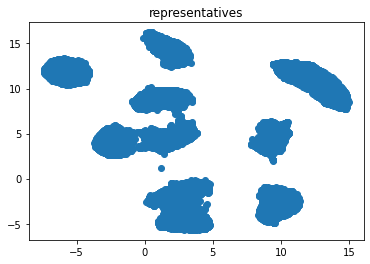

In [49]:
# This is the actual Algorithm
flag = 0
startepoch = 0
for epoch in range(startepoch, 500):
    if logger:
        logger.log_value('sigma1', _sigma1, epoch)
        logger.log_value('sigma2', _sigma2, epoch)
        logger.log_value('lambda', _lambda, epoch)

    train(trainloader, net_extract, optimizer, criterion1, criterion2, epoch, use_cuda, _sigma1, _sigma2, _lambda, logger)
    Z, U, change_in_assign, assignment = test(testloader, net_extract, criterion2, epoch, use_cuda, _delta, pairs, numeval, flag, logger)

    if flag:
        # As long as the change in label assignment < threshold, DCC continues to run.
        # Note: This condition is always met in the very first epoch after the flag is set.
        # This false criterion is overwritten by checking for the condition twice.
        if change_in_assign > stopping_threshold:
            flag += 1
        if flag == 4:
            break

    if((epoch+1) % 20 == 0):
        _sigma1 = max(_delta1, _sigma1 / 2)
        _sigma2 = max(_delta2, _sigma2 / 2)
        if _sigma2 == _delta2 and flag == 0:
            # Start checking for stopping criterion
            flag = 1

    # Save checkpoint
    index = (epoch // 20) * 20
    save_checkpoint({'epoch': epoch+1,
                     'state_dict': net_extract.state_dict(),
                     'criterion_state_dict': criterion2.state_dict(),
                     'optimizer': optimizer.state_dict(),
                     'sigma1': _sigma1,
                     'sigma2': _sigma2,
                     'lambda': _lambda,
                     'delta': _delta,
                     'delta1': _delta1,
                     'delta2': _delta2,
                     }, index, filename=outputdir)

output = {'Z': Z, 'U': U, 'gtlabels': labels, 'w': pairs, 'cluster':assignment}
sio.savemat(os.path.join(outputdir, 'features'), output)

In [53]:
import scipy

In [54]:
scipy.misc.toimage??

Object `scipy.misc.toimage` not found.


In [156]:
res = sio.loadmat(os.path.join(outputdir, 'features'))

In [157]:
res

{'U': array([[ -5.407432  ,  -5.6290874 ,  -1.9247844 , ...,   3.980182  ,
           6.839632  ,  -4.0599127 ],
        [ -5.324801  , -10.851965  ,  -2.4206238 , ...,   5.6886983 ,
           6.016314  ,  -9.239853  ],
        [ -3.8557646 ,  -5.709679  ,  -0.83330935, ...,   5.9645925 ,
           8.866482  ,  -3.7869685 ],
        ...,
        [ -3.3040922 ,  -3.7238603 ,  -0.7880085 , ...,   4.9638944 ,
           9.09623   ,  -4.8336377 ],
        [ -4.080694  ,  -5.191547  ,  -1.463129  , ...,   3.4302168 ,
           6.127523  ,  -5.89063   ],
        [ -3.6779573 ,  -5.9111953 ,  -2.7180548 , ...,   5.380582  ,
           7.882025  ,  -8.37149   ]], dtype=float32),
 'Z': array([[ -5.5094085,  -5.5974894,  -1.9728365, ...,   4.067024 ,
           6.8233356,  -4.2201853],
        [ -5.3062053, -10.87132  ,  -2.4539514, ...,   5.6397653,
           6.095742 ,  -9.062557 ],
        [ -3.8942251,  -5.581669 ,  -0.7499631, ...,   5.9267473,
           8.872319 ,  -3.835769 ],
      

In [70]:
dcc_dict = torch.load("/Users/jasper/ref_projects/DCC/data/mnist/results/FTcheckpoint_260.pth.tar")

In [71]:
net_dcc = extractSDAE(dim=[784, 500, 500, 2000, 10], slope=0)

net_dcc.load_state_dict(dcc_dict['state_dict'])

<All keys matched successfully>

In [75]:
with torch.no_grad():
    inputs_Var = Variable(torch.from_numpy(trainset.train_data))
    enc, dec = net_dcc(inputs_Var)
    features = enc.data.cpu().numpy()
    labels = targets
    original = inputs.cpu().numpy()

In [82]:
dec.shape

torch.Size([60000, 784])

In [77]:
features.shape

(60000, 10)

In [158]:
res['U'].shape

(70000, 10)

In [161]:
res['Z'].shape

(70000, 10)

In [167]:
len(np.unique(res['cluster'].flatten()))

353

In [169]:
import pandas as pd

In [175]:
totalset.datasets[0]

In [179]:
len(trainset.)

172605

In [178]:
len(totalset)

70000

In [194]:
32*32

1024

In [195]:
totalset[0][0].shape

(784,)

In [196]:
np.sqrt(784)

28.0

In [198]:
def mgcMultiHeat_mse2(**kwargs):
    
    """
    return multiple heatmap plot
    """
    from mpl_toolkits.axes_grid1 import ImageGrid
    
    def_vals = {'x_train': None,
                'arr_mse': None,
                'arr_mse_indx': None, 
                'cell_id': None,
                'label_class': 'class name',
                'set_random': False,
                'rowx' : 7, 
                'colx' :5, 
                'img_rows' : 25, 
                'img_cols': 24, 
                'fname': 'plt_heat'}

    for k, v in def_vals.items():
        kwargs.setdefault(k, v)

    x_train = kwargs['x_train']
    arr_mse = kwargs['arr_mse']
    arr_mse_indx = kwargs['arr_mse_indx']
    cell_id = kwargs['cell_id']
    label_class = kwargs['label_class']
    set_random = kwargs['set_random']
    rowx = kwargs['rowx']
    colx = kwargs['colx']
    img_rows = kwargs['img_rows']
    img_cols = kwargs['img_cols']
    fname = kwargs['fname']
    
    import time
    timestr = time.strftime("%Y%m%d-%H%M%S")
    _fname_ext = fname + "_" + timestr

    if arr_mse_indx is None:
        arr_mse_indx = np.array(range(x_train.shape[0]))
        
    if arr_mse is None:
        arr_mse = np.empty((x_train.shape[0]))
        arr_mse.fill(np.nan)
        total_cell = x_train.shape[0]
        print(arr_mse)
        print(type(arr_mse))
    else:
        total_cell = len(arr_mse_indx)
        #arr_mse = -np.sort(arr_mse)
        #arr_mse = arr_mse[np.argsort(-arr_mse)]
        
    if (len(arr_mse_indx) <= rowx * colx):
        rowx = math.ceil(len(arr_mse_indx) / colx)
        row_idx = arr_mse_indx[:]
        
    else:
        rowx = rowx
        
        if set_random == True:
            row_idx = np.random.choice(arr_mse_indx, rowx * colx)
            print("select random")
        else:
            row_idx = arr_mse_indx[:rowx * colx]

    if cell_id is None:
        cell_id = np.array(['c_' + str(i).zfill(4) for i in range(x_train.shape[0])])
        
        
    #row_idx = arr_mse_indx
    #print("row_idx", row_idx)
    x_train_sub = x_train[row_idx,:]
    arr_mse_sub = arr_mse[row_idx]
    #print("before sorted", arr_mse_sub)
    
    arr_label_sub = range(len(row_idx))
    cell_id_sub = cell_id[row_idx]
    #cell_id =  range(len(row_idx))

    # sort by mse descending
    
    mse_idx = np.argsort(arr_mse_sub)[::-1]
    #print("mse_idx", mse_idx)
    #x_train_sub = x_train_sub1[mse_idx]
    #arr_mse_sub_sort = arr_mse_sub[mse_idx]
    #print("sorted", arr_mse_sub)
    #row_idx_sub = row_idx[mse_idx]
    #cell_id = row_idx

    print('total cell: {0}/{1} cells'.format(len(arr_mse_sub), total_cell))
    print("unique cell {0}/{1}".format(pd.Series(cell_id[arr_mse_indx]).nunique(), total_cell))
    #print("class: {0}".format(label_class))

    indx = range(x_train_sub.shape[0])
    fig = plt.figure(figsize=(20, 10))
    
    grid = ImageGrid(fig, 111,          # as in plt.subplot(111)
                     nrows_ncols=(rowx, colx),
                     axes_pad=0.45,
                     share_all=True,
                     cbar_location="right",
                     cbar_mode="single",
                     cbar_size="7%",
                     cbar_pad=0.15,
                     )

    # Add data to image grid
    #for arr_indx, ax in enumerate(grid):
    for arr_indx, ax in zip(mse_idx, grid):
        im = ax.imshow(x_train_sub[arr_indx,:,:,0], interpolation='spline16', cmap=plt.cm.get_cmap('RdYlGn_r'))
        im.set_clim(vmin=0, vmax=1) #max_value = -81.53, min_value = -182.00
        ax.set_title("MSE {0:.3g}, \n i:{1}, ci: {2}".format(arr_mse_sub[arr_indx], row_idx[arr_indx], cell_id_sub[arr_indx]), color='red')
        plt.tight_layout()
    
    # Colorbar
    ax.cax.colorbar(im)
    ax.cax.toggle_label(True)
    
    fig.suptitle("Class ID {0}".format(label_class), fontsize=20, fontweight=0, color='black', style='italic', y=1.02)

    plt.savefig("./{}.png".format(_fname_ext), bbox_inches = 'tight')
    #plt.savefig("./{}.svg".format(_fname_ext), bbox_inches = 'tight') 
    plt.show()  

In [207]:
arr_data = np.zeros((len(totalset), 28, 28))

In [208]:
arr_data.shape

(70000, 28, 28)

In [212]:
len(res['cluster'].flatten())

70000

In [220]:
arr_data = np.asarray([totalset[i][0].reshape(28, 28) for i in range(len(totalset))])

In [235]:
arr_gtlabel = np.asarray([totalset[i][1] for i in range(len(totalset))])

In [238]:
arr_gtlabel.shape

(70000,)

In [237]:
arr_data.shape

(70000, 28, 28, 1)

In [204]:
totalset[0][0].reshape(28,28)

(28, 28)

In [226]:
arr_data = arr_data.reshape(-1, 28, 28, 1)

In [228]:
arr_data[0].shape

(28, 28, 1)

In [224]:
arr_label = res['cluster'].flatten()

In [247]:
arr_U = res['U'].copy()

In [248]:
arr_U.shape

(70000, 10)

In [258]:
lst_top_classes = pd.Series(arr_label).value_counts().index.tolist()[:10]

lst_bottom_classes = pd.Series(arr_label).value_counts().index.tolist()[-20:]

lst_ix_selected = [i for i,v in enumerate(arr_label) if v in lst_top_classes]

len(lst_ix_selected)

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 10/70000


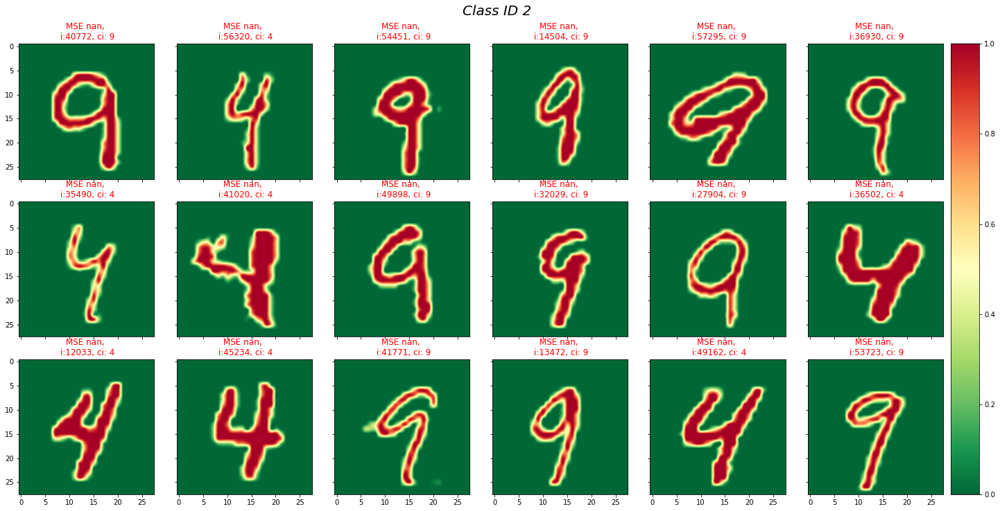

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 9/70000


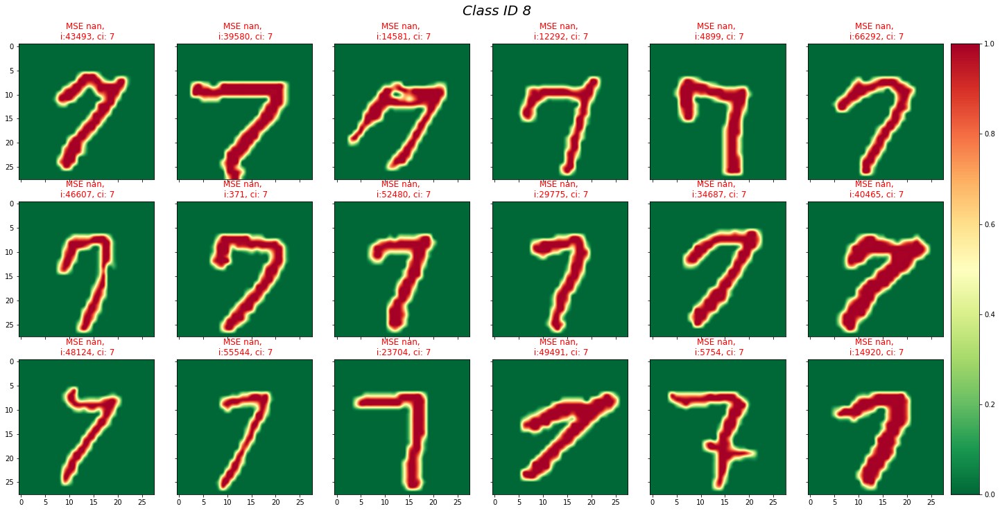

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 9/70000


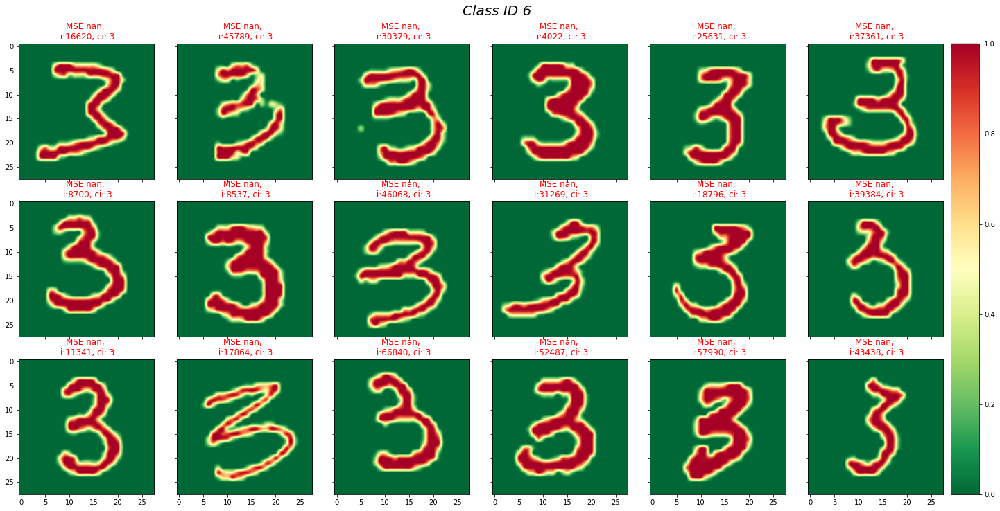

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 10/70000


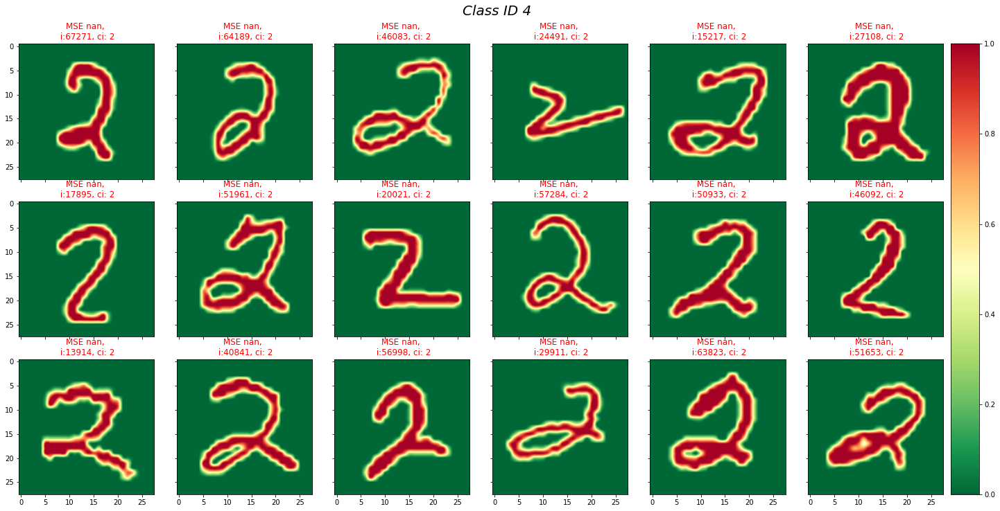

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 8/70000


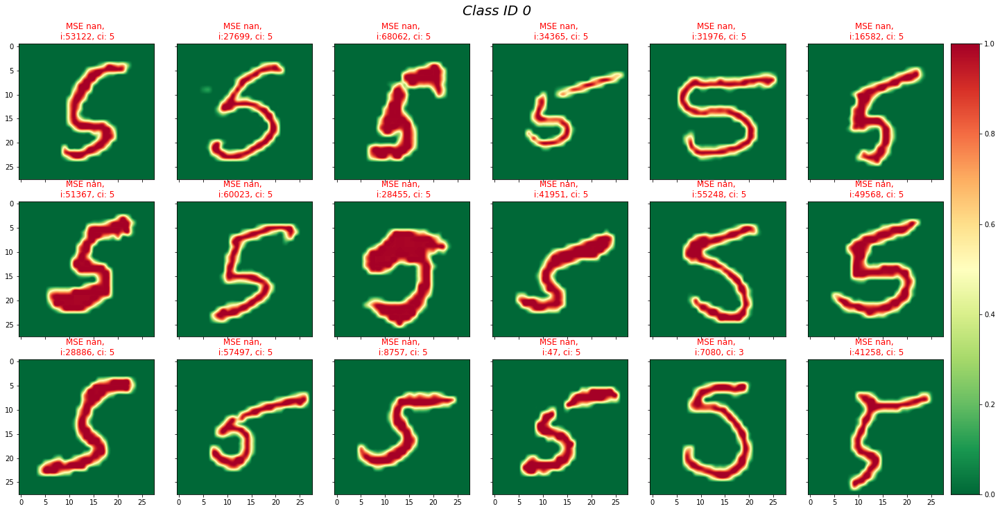

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 10/70000


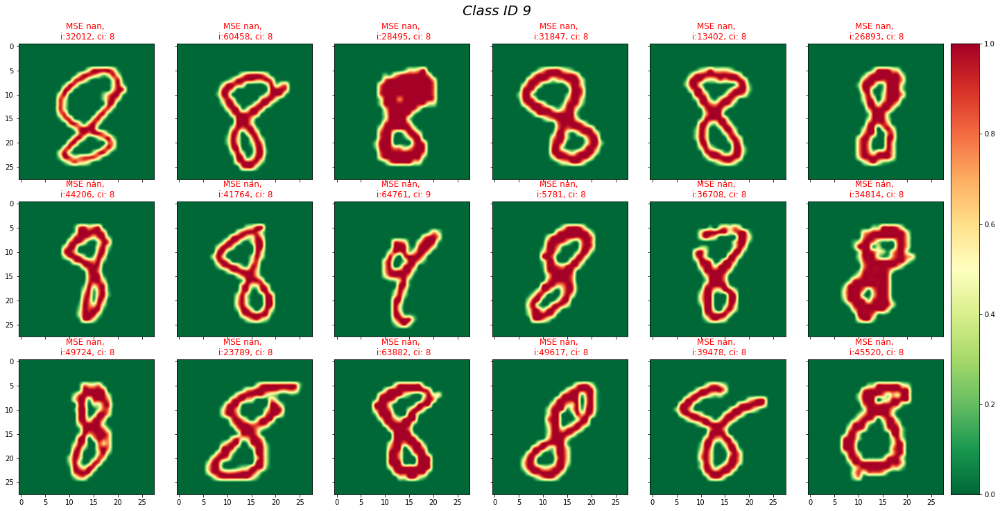

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 9/70000


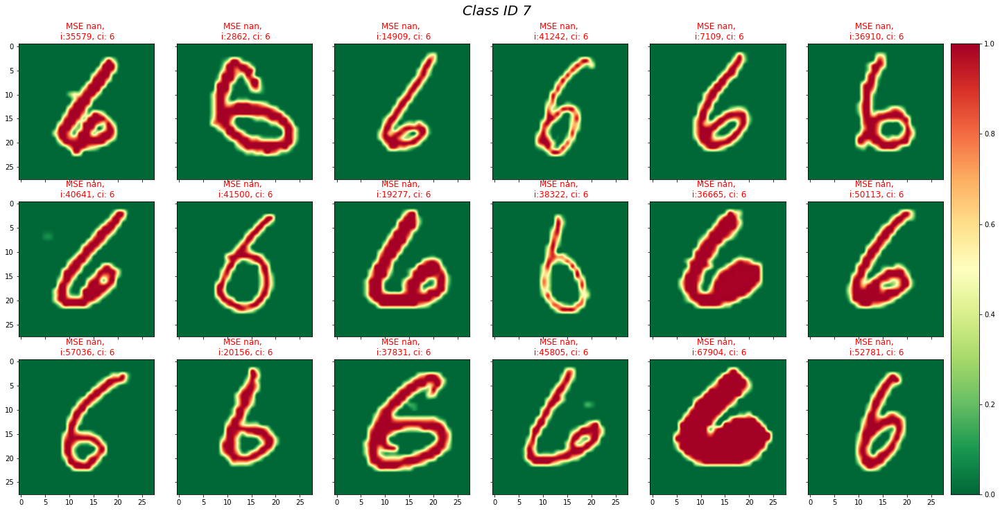

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 9/70000


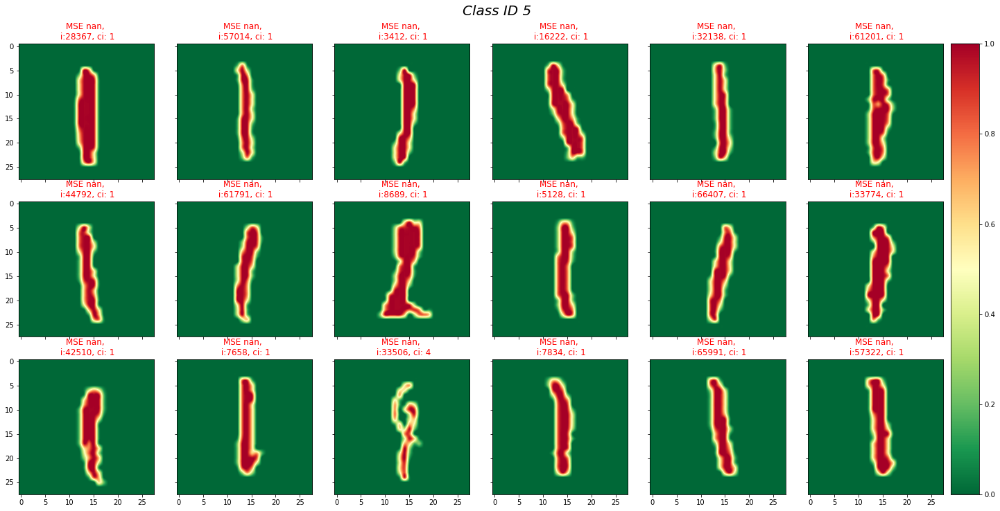

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 8/70000


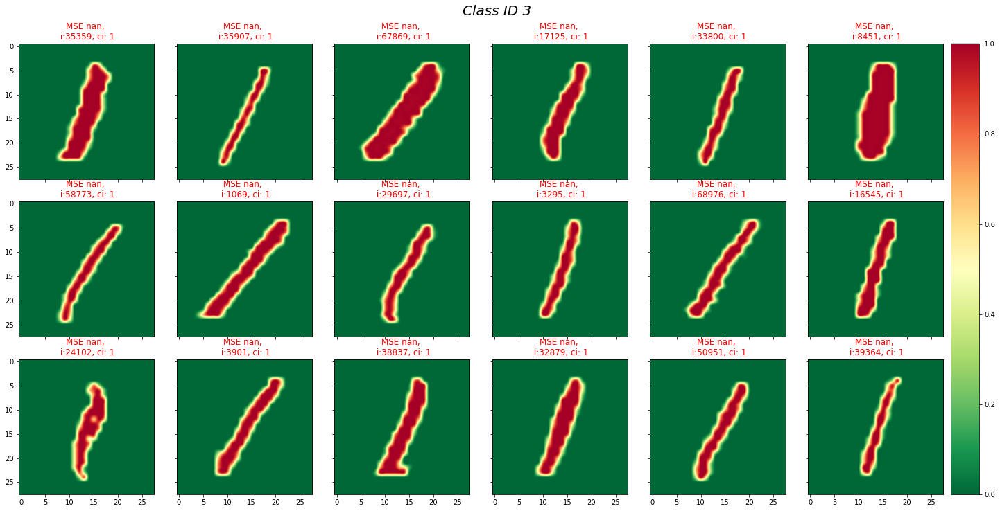

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 7/70000


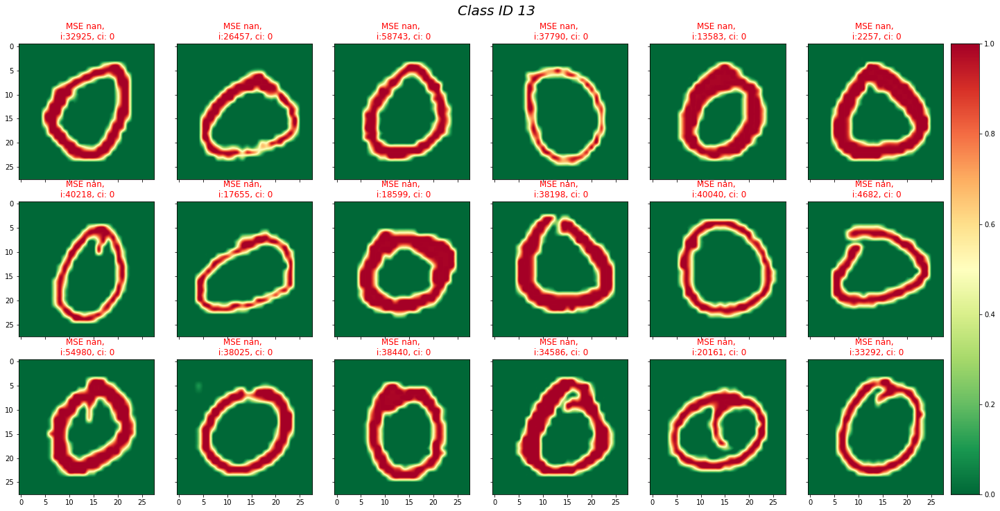

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 6/70000


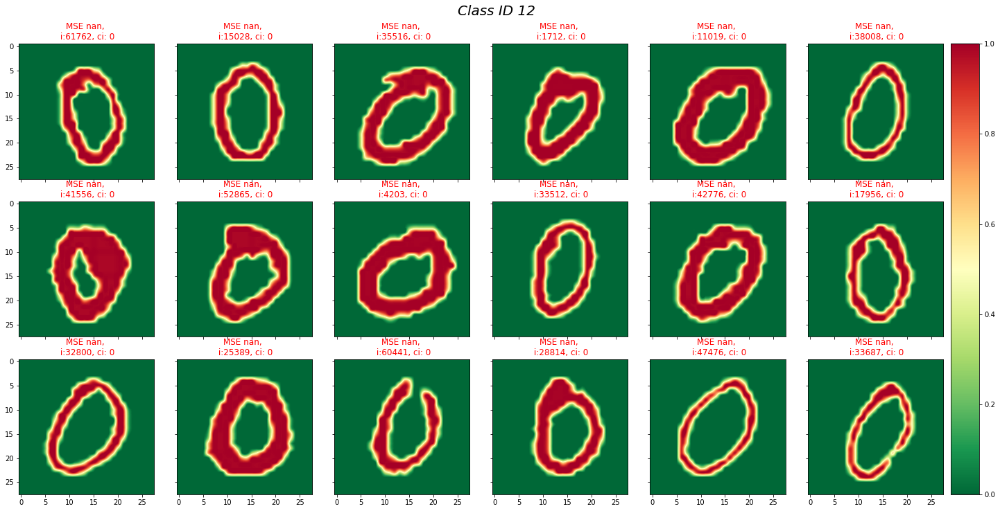

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 8/70000


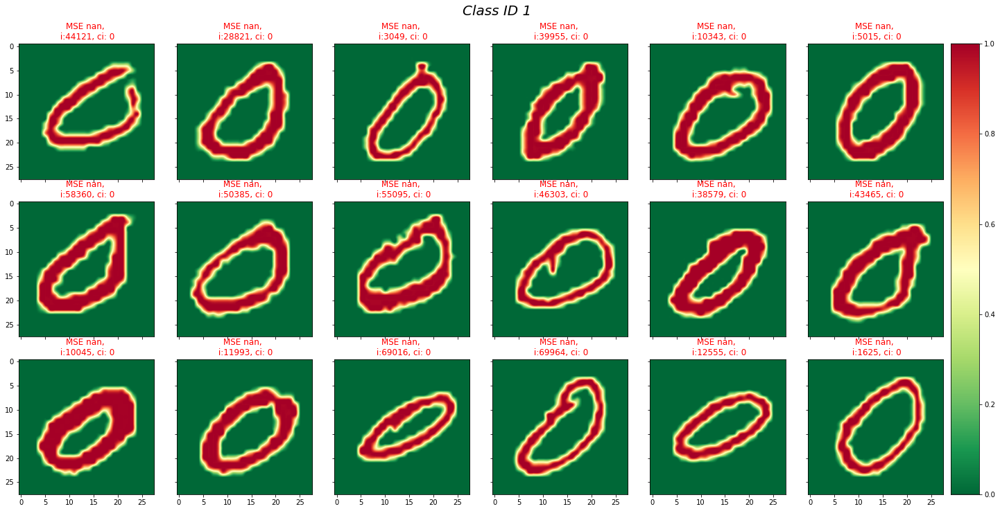

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 7/70000


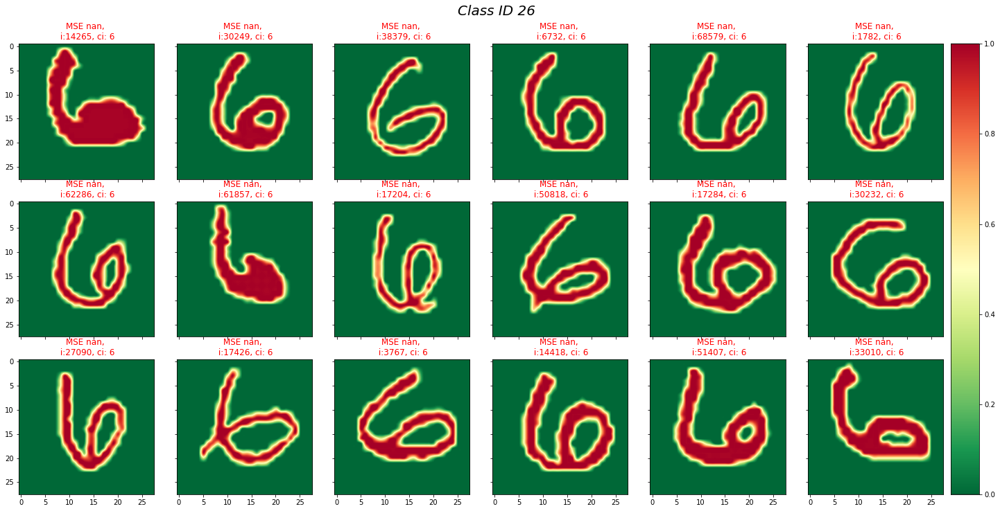

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 5/70000


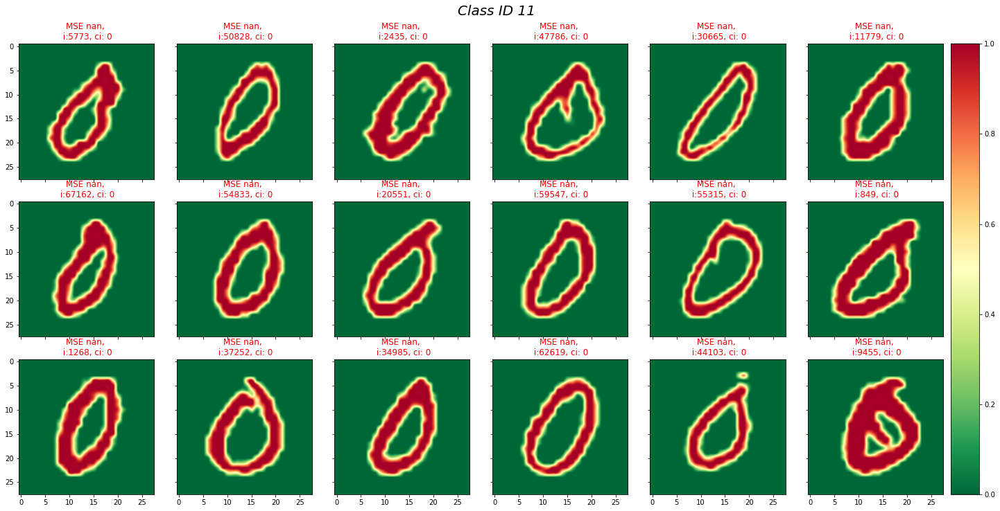

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 5/70000


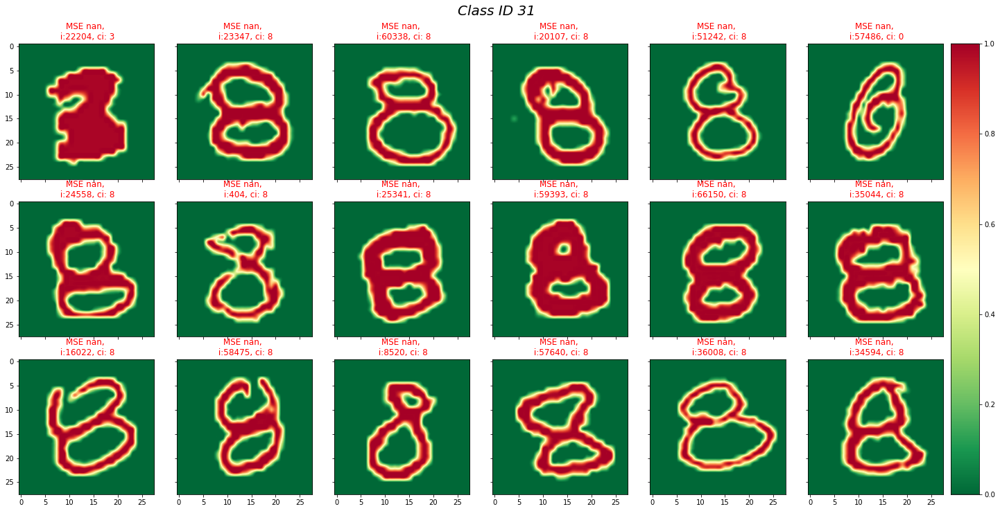

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 3/70000


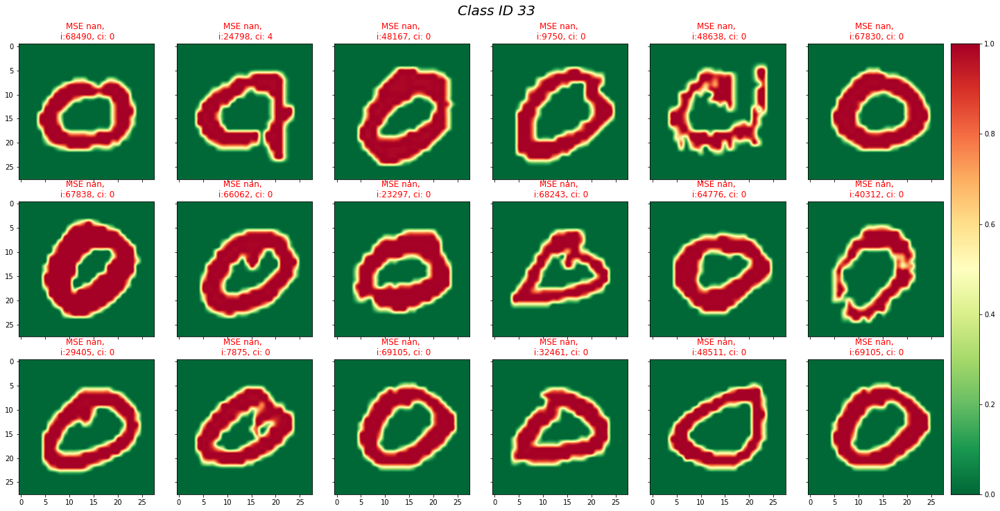

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 4/70000


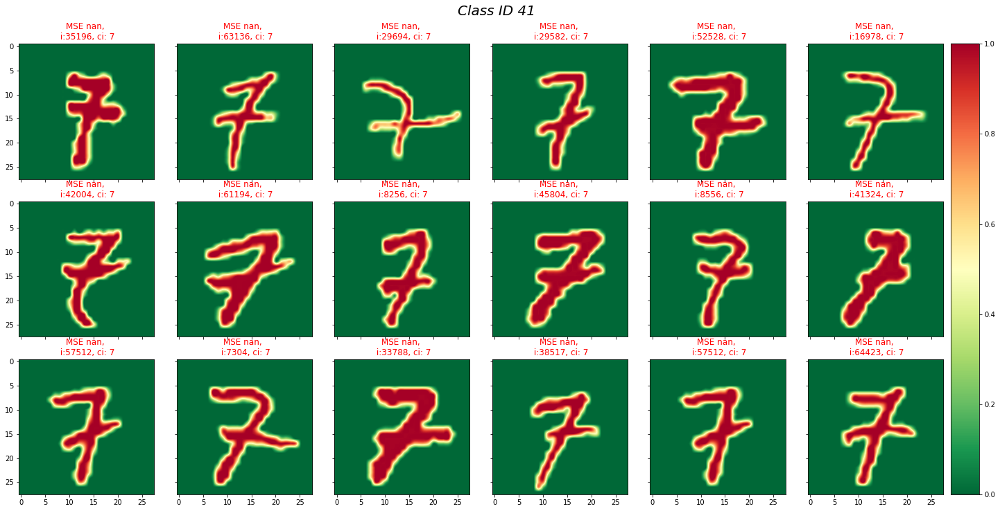

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 5/70000


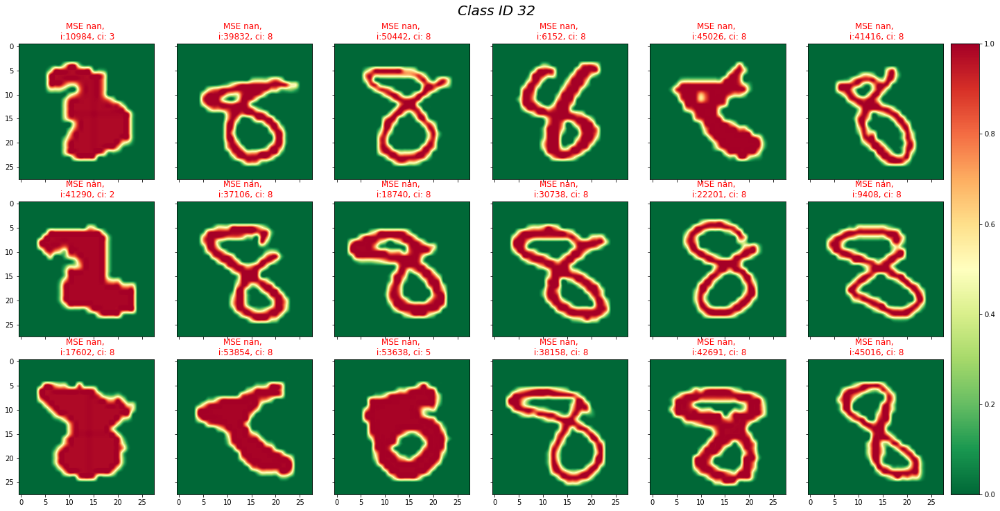

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 7/70000


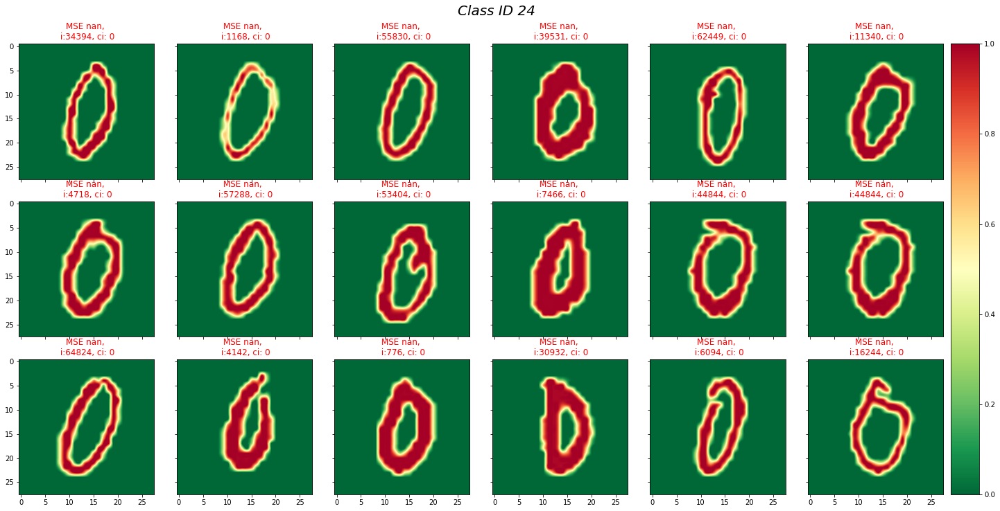

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
select random
total cell: 18/70000 cells
unique cell 4/70000


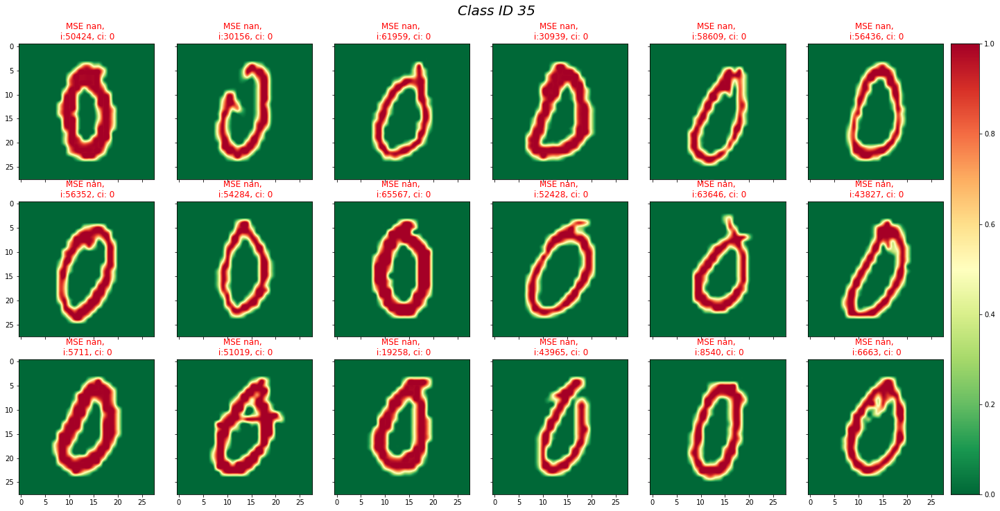

In [244]:
# default parameter values
def_vals = {'x_train' : arr_data, 
            'arr_mse': None, 
            'arr_mse_indx': None, 
            'cell_id': arr_gtlabel,
            'label_class': 'my_class', 
            'set_random': True,
            'rowx' : 3, 
            'colx' :6, 
            'img_rows' : 25, 
            'img_cols': 24, 
            'fname': 'plt_heat'}
# update dictionary key value

selcted_clusters = lst_top_classes
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where(arr_label == cluster_id)[0]
    
    def_vals['label_class'] = cluster_id
    def_vals['arr_mse_indx'] = class_indx
    mgcMultiHeat_mse2(**def_vals)

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


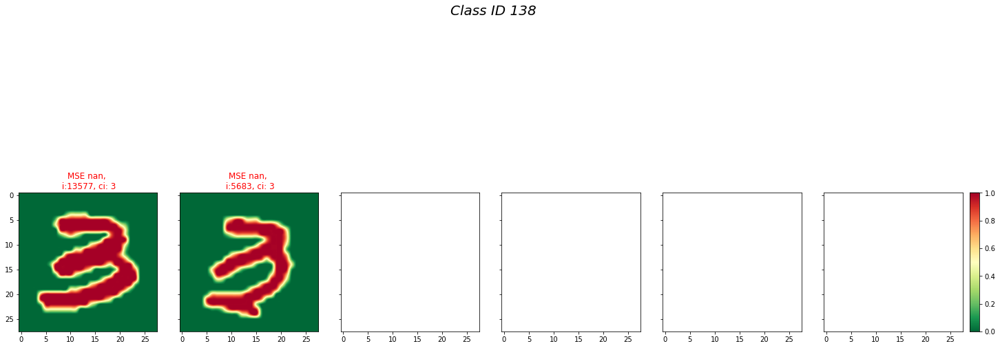

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


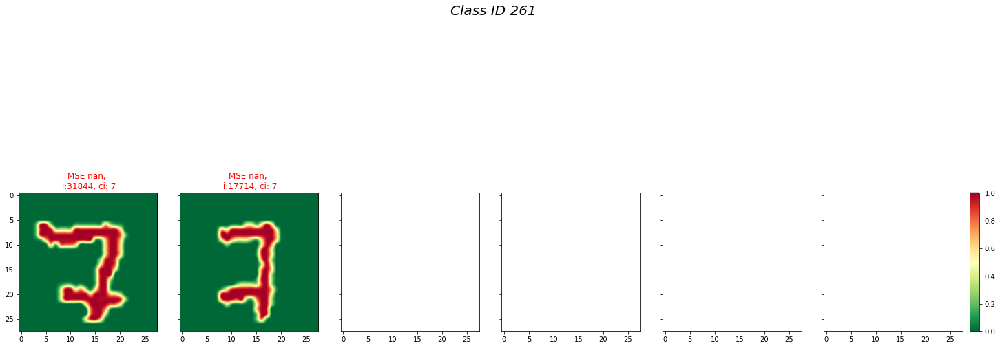

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 2/70000


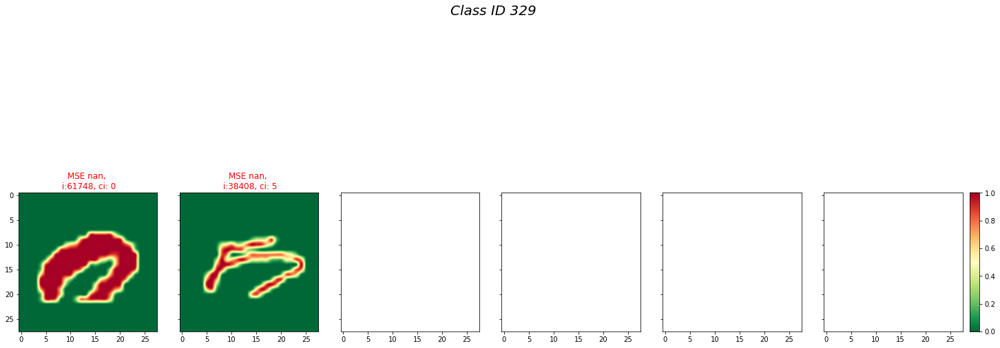

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


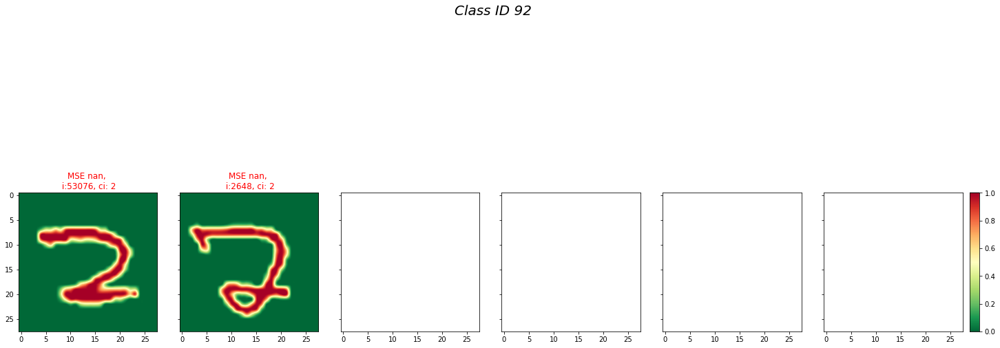

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


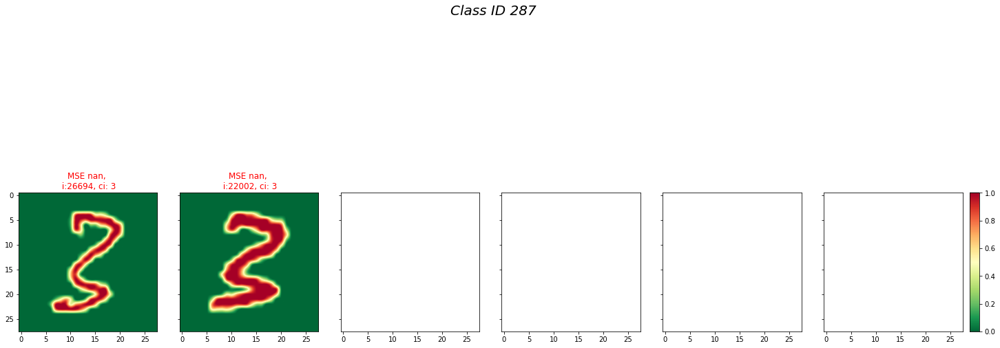

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


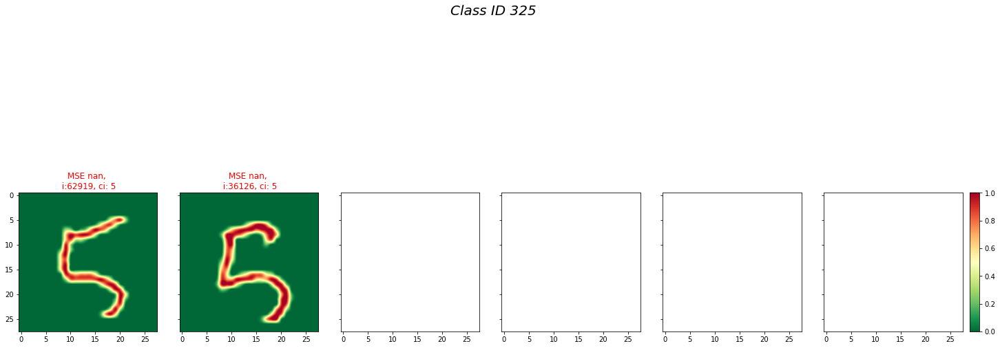

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


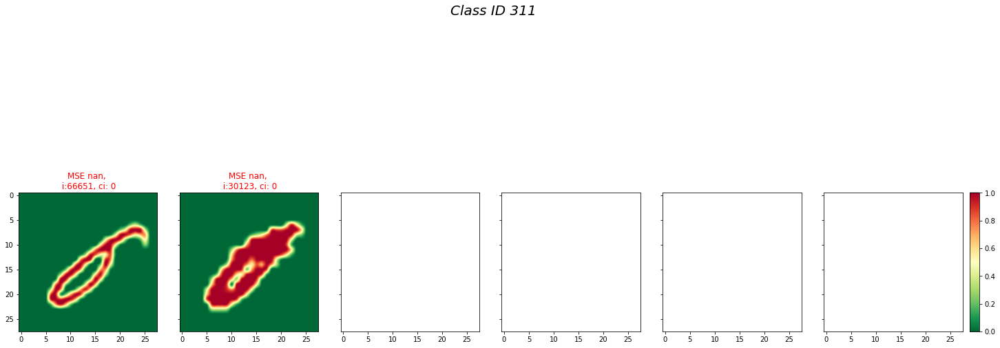

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


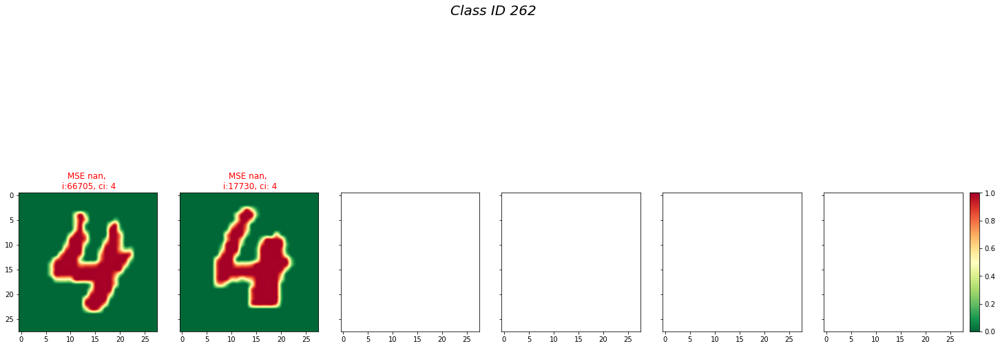

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 2/70000


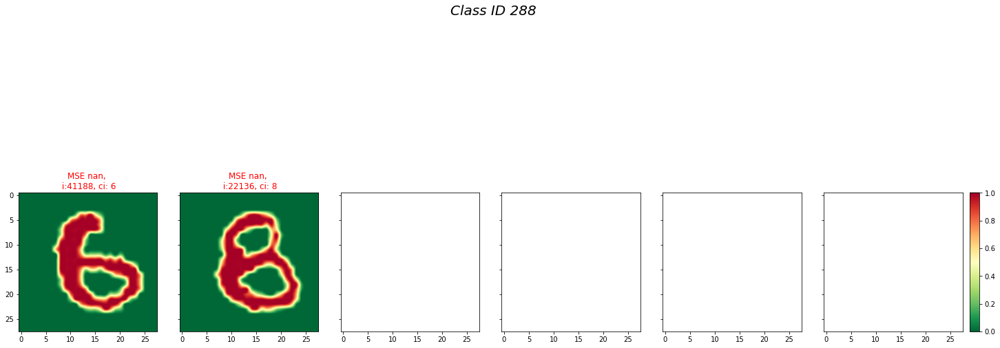

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


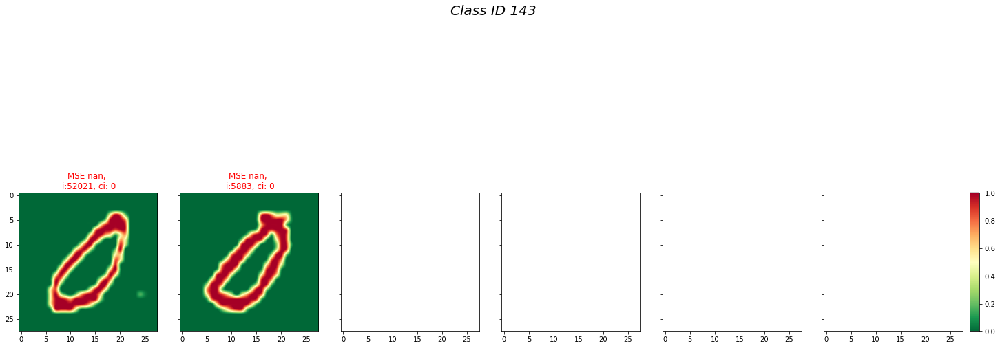

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


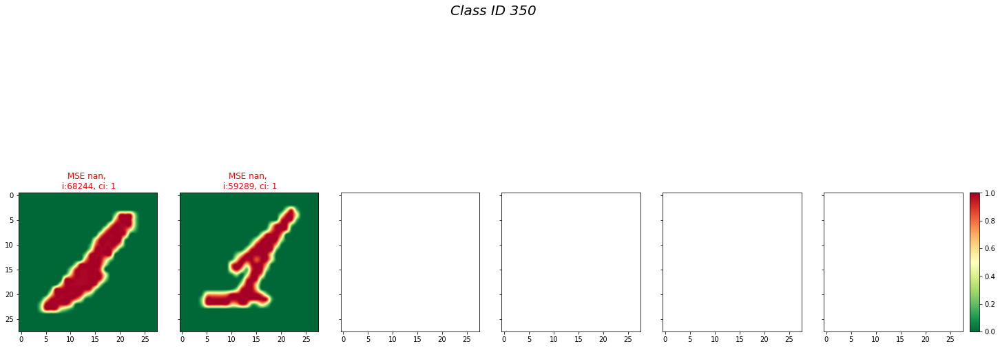

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 1/70000


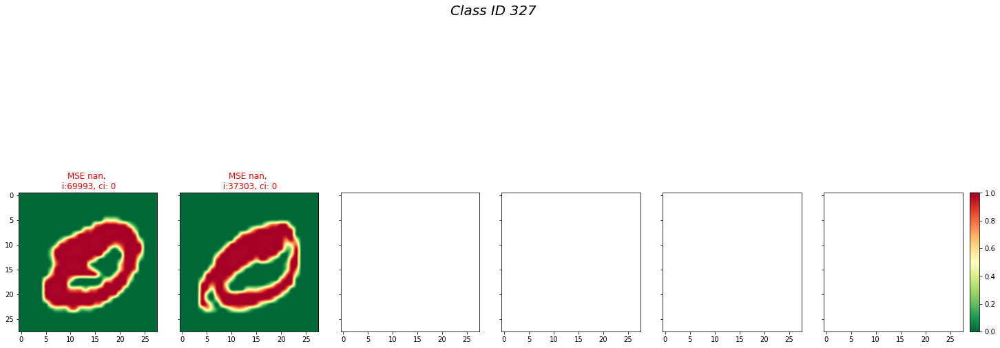

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 2/70000 cells
unique cell 2/70000


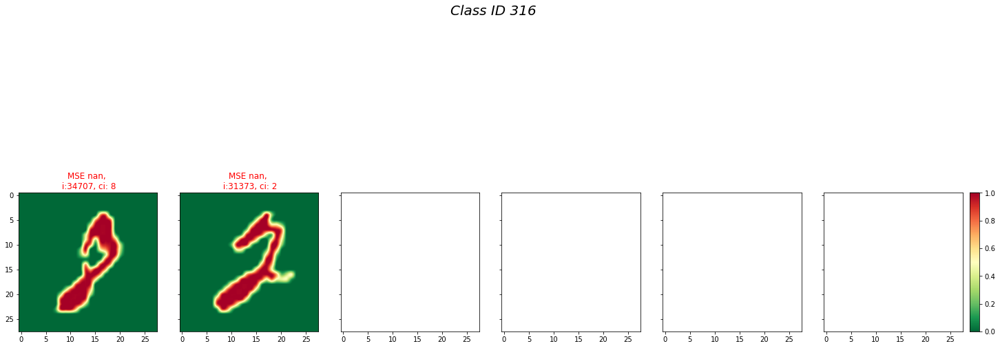

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


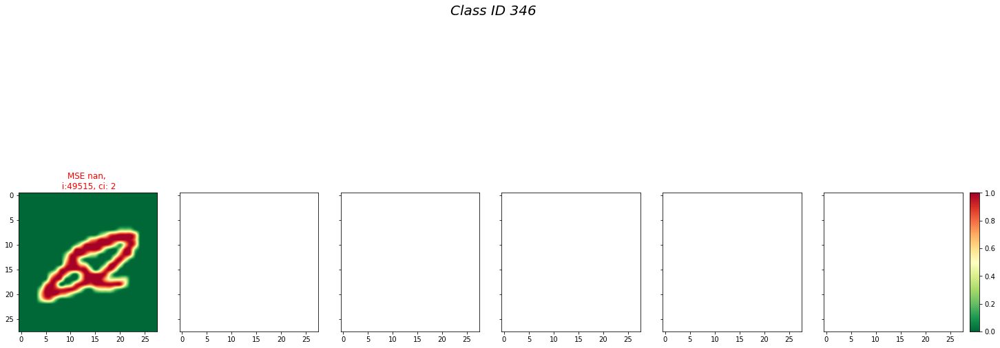

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


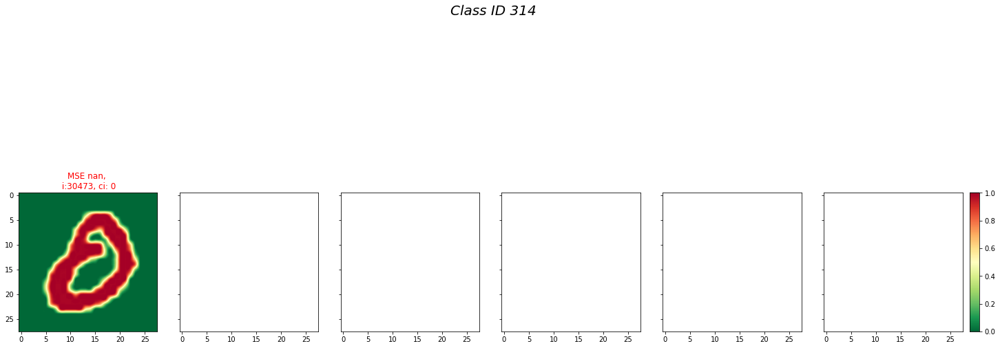

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


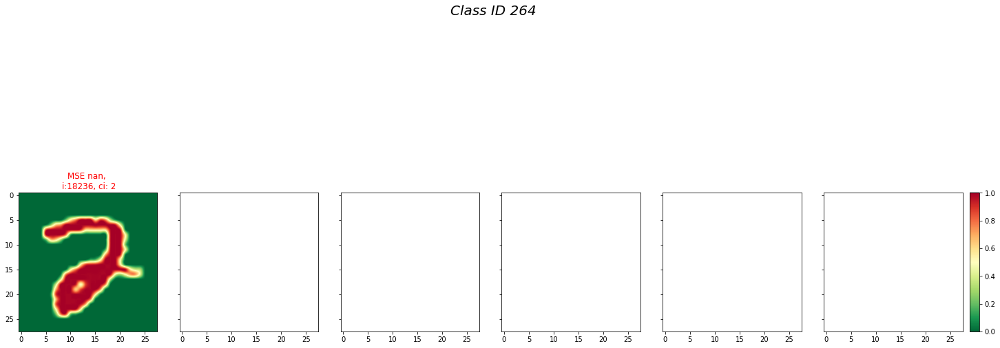

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


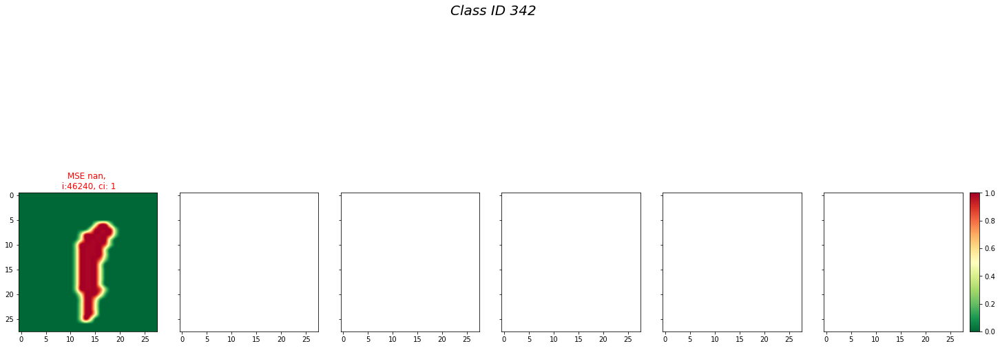

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


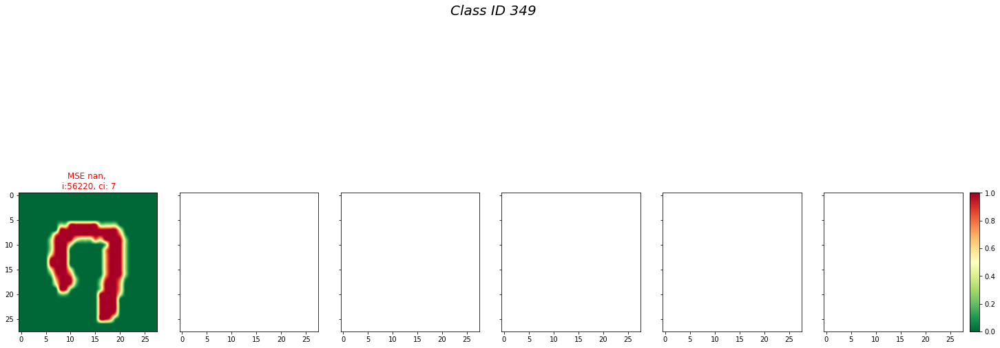

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


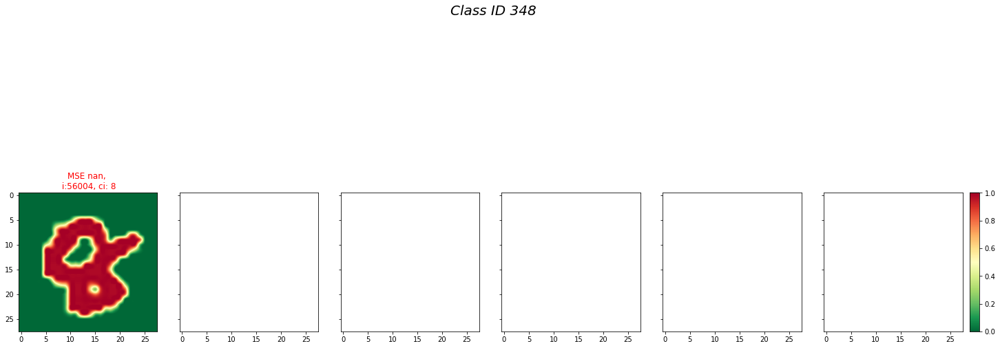

[nan nan nan ... nan nan nan]
<class 'numpy.ndarray'>
total cell: 1/70000 cells
unique cell 1/70000


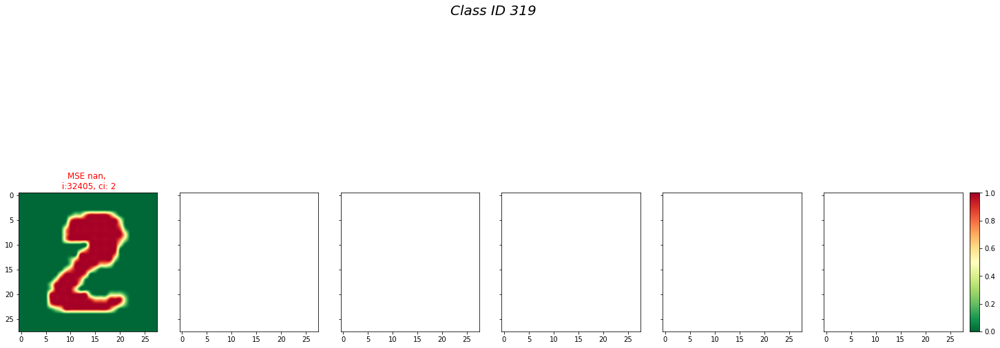

In [246]:
# default parameter values
def_vals = {'x_train' : arr_data, 
            'arr_mse': None, 
            'arr_mse_indx': None, 
            'cell_id': arr_gtlabel,
            'label_class': 'my_class', 
            'set_random': True,
            'rowx' : 3, 
            'colx' :6, 
            'img_rows' : 25, 
            'img_cols': 24, 
            'fname': 'plt_heat'}
# update dictionary key value

selcted_clusters = lst_bottom_classes
# selcted_clusters = np.unique(arr_label)
for cluster_id in selcted_clusters:
    class_indx = np.where(arr_label == cluster_id)[0]
    
    def_vals['label_class'] = cluster_id
    def_vals['arr_mse_indx'] = class_indx
    mgcMultiHeat_mse2(**def_vals)

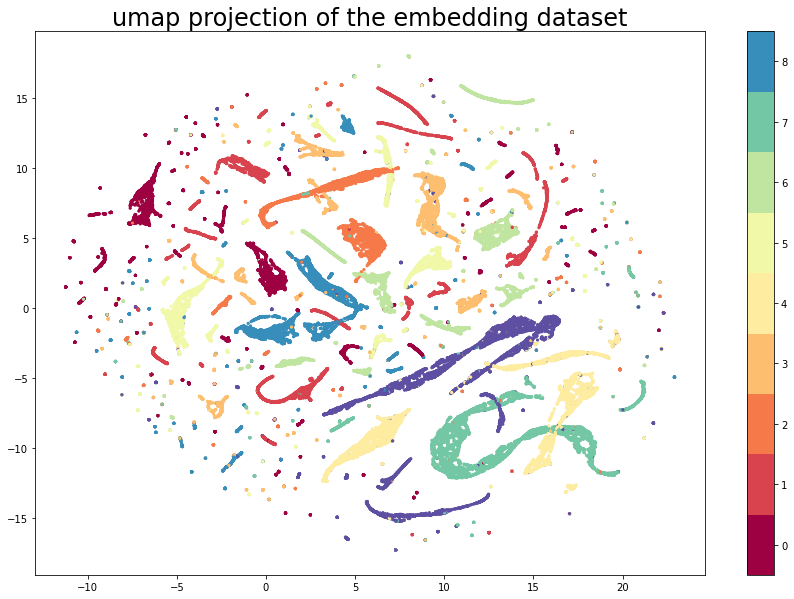

In [263]:
data_viz(res['U'], res['gtlabels'].flatten())

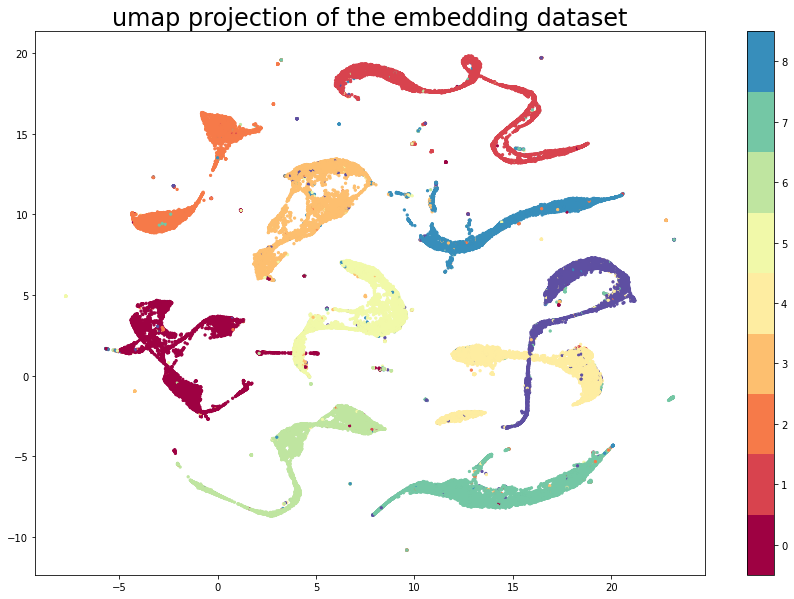

In [164]:
data_viz(res['Z'], res['gtlabels'].flatten())

In [52]:
dir(net_dcc)

['__class__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'clear',
 'copy',
 'fromkeys',
 'get',
 'items',
 'keys',
 'pop',
 'popitem',
 'setdefault',
 'update',
 'values']

In [ ]:
Z, U, change_in_assign, assignment = test(testloader, net_dcc, criterion2, epoch, use_cuda, _delta, pairs, numeval, flag, logger)


In [108]:
outputdir

'/Users/jasper/ref_projects/DCC/data/mnist/results'

In [ ]:
1